# RevivaColor

## Import libraries

In [1]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Computer Vision/RevivaColor

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/My Drive/Computer Vision/RevivaColor


In [2]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [3]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

In [4]:
!pip install visualkeras --quiet
import visualkeras

In [5]:
import Utils as ut
import math
from PIL import Image
import cv2
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

## Load Data

### Import images

In [6]:
data = ut.load_images('Dataset')
data_bal = ut.load_images('Dataset', balance=True)
data_lab = ut.load_images('Dataset', lab=True)
data_lab_bal = ut.load_images('Dataset', balance=True, lab=True)

### Data Exploration and Preprocessing

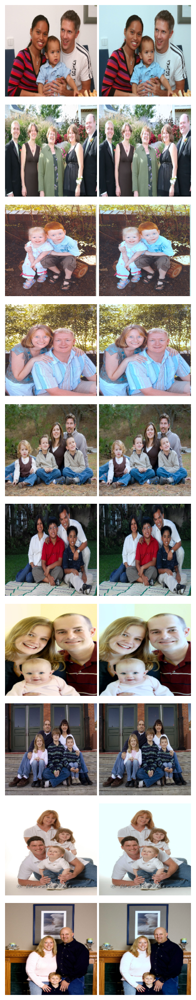

In [ ]:
# Show the difference between the original and white-balanced images

show_diff = []
for i in range(10):
    show_diff.append(data[i])
    show_diff.append(data_bal[i])

fig, axes = plt.subplots(10, 2, figsize=(4,20))
for i in range(20):
    ax = axes[i%20//2, i%2]
    ax.imshow(np.clip(show_diff[i], 0, 255))
    ax.axis('off')
plt.tight_layout()
plt.show()

In [7]:
# Data preprocessing

X = np.array(data_lab_bal)[:,:,:,0]/100
y = np.array(data_lab_bal)[:,:,:,1:]/128

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=len(X_test))

X_train = X_train.reshape(X_train.shape+(1,))
X_val = X_val.reshape(X_val.shape+(1,))
X_test = X_test.reshape(X_test.shape+(1,))

print(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape)

(3877, 256, 256, 1) (485, 256, 256, 1) (485, 256, 256, 1) (3877, 256, 256, 2) (485, 256, 256, 2) (485, 256, 256, 2)


In [8]:
input_shape = X_train.shape[1:]
output_shape = y_train.shape[1:]

print(f'Input shape: {input_shape}\nOutput shape: {output_shape}')

Input shape: (256, 256, 1)
Output shape: (256, 256, 2)


In [ ]:
test_pics = np.zeros((X_test.shape[0], 256, 256, 3))
test_pics[:,:,:,0] = X_test[:,:,:,0]*100
test_pics[:,:,:,1:] = y_test[:,:,:,0:]*128
test_pics = [lab2rgb(img) for img in test_pics]

In [ ]:
del data_lab_bal

## Model functions

### Custom loss functions

We define two custom loss functions:
- PSNR (Peak Signal-to-Noise Ratio);
- SSIM (Structural Similarity Index Metrics).

The main parameters of both functions are `a`, `b`, `max_val`. The two images to be compared are passed as `a` and `b`, while `max_val` is the dynamic range of the images (i.e., the difference between the maximum the and minimum allowed values).

We set `max_val` as `2.0` since the AB channels of the LAB format are encoded as `[-1; +1]` (the channels range from -128 to +127 but due to normalization we have values between -1 and +1).

In [9]:
def PSNRLoss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.psnr(y_true, y_pred, 2.0))

def SSIMLoss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, 2.0))

### Build convolutional blocks

In [ ]:
# Define a convolutional block with batch normalization option
def conv_bn_block(x, filters, kernel_size, padding='same', stride=1, downsample=True, activation='relu', stack=1, batch_norm=True, name=''):

    '''
    Creating a simple convolutional block with batch normalization

    Args:
        x (tfk layer): previous layer
        filters (int): number of filters
        kernel size (int tuple): size of the filters
        padding (str): type of pudding (valid,same,full)
        downsample (bool): to add or not a MaxPooling layer
        activation (str): type of activation function to use
        stack (int): number of convolutional layer to add
        batch_norm (bool): add or not a batch norm
        name (str): name of convolutional block

    Returns:
        convolutional block
    '''

    if downsample:  # If downsample is True, apply max-pooling
        x = tfkl.MaxPooling2D(name='Enc_MaxPool_' + name)(x)

    # Apply a stack of convolutional layers with optional batch normalization and specified activation
    for s in range(stack):
        x = tfkl.Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, strides=stride, name='Enc_Conv_' + name + str(s+1))(x)
        if batch_norm:
            x = tfkl.BatchNormalization(name='Enc_BatchNorm_' + name + str(s+1))(x)
        x = tfkl.Activation(activation, name='Enc_Activation_' + name + str(s+1))(x)

    return x

In [ ]:
def up_conv_bn_block(x, filters, kernel_size, padding='same', stride=1, upsample=True, activation='relu', stack=1, batch_norm=True, name=''):

    '''
    Creating a simple convolutional block and upsampling with batch normalization

    Args:
        x (tfk layer): previous layer
        filters (int): number of filters
        kernel size (int tuple): size of the filters
        padding (str): type of pudding (valid,same,full)
        upsampling (bool): to add or not a UpSample layer
        activation (str): type of activation function to use
        stack (int): number of convolutional layer to add
        batch_norm (bool): add or not a batch norm
        name (str): name of convolutional block

    Returns:
        convolutional block
    '''

    # Apply a stack of convolutional layers with optional batch normalization and specified activation
    for s in range(stack):
        if upsample:    # If downsample is True, apply upsampling
            x = tfkl.UpSampling2D(name='Dec_UpSample_' + name + str(s+1))(x)
        x = tfkl.Conv2D(filters=filters, kernel_size=kernel_size, padding=padding, strides=stride, name='Dec_Conv_Tr' + name + str(s+1))(x)
        if batch_norm:
            x = tfkl.BatchNormalization(name='Dec_BatchNorm_' + name + str(s+1))(x)
        x = tfkl.Activation(activation, name='Dec_Activation_' + name + str(s+1))(x)

    return x

## Autoencoder

In [ ]:
def build_encoder(enc_input_shape, enc_output_shape):

    '''
    Create the encoder.

    Args:
        enc_input_shape (tuple): the dimension of the input tensor.
        enc_output_shape (tuple): the dimension of the output tensor.

    Returns:
        model
    '''

    input_layer = tfkl.Input(shape=enc_input_shape, name='encoder_input_layer') # 256, 256, 1

    x = conv_bn_block(x=input_layer, filters=8, kernel_size=3, downsample=True, name='1')   # 128, 128, 8
    x = conv_bn_block(x=x, filters=8, kernel_size=3, downsample=False, name='2')            # 128, 128, 8
    x = conv_bn_block(x=x, filters=16, kernel_size=3, downsample=True, name='3')            # 64, 64, 16
    x = conv_bn_block(x=x, filters=16, kernel_size=3, downsample=False, name='4')           # 64, 64, 16
    x = conv_bn_block(x=x, filters=32, kernel_size=3, downsample=True, name='5')            # 32, 32, 32
    x = conv_bn_block(x=x, filters=64, kernel_size=3, downsample=False, name='6')           # 32, 32, 64
    x = conv_bn_block(x=x, filters=128, kernel_size=3, downsample=True, name='7')           # 16, 16, 128

    model = tfk.Model(inputs=input_layer, outputs=x, name='Encoder')

    return model

In [ ]:
def build_decoder(dec_input_shape, dec_output_shape):

    '''
    Create the decoder.

    Args:
        dec_input_shape (tuple): the dimension of the input tensor.
        dec_output_shape (tuple): the dimension of the output tensor.

    Returns:
        model
    '''

    input_layer = tfkl.Input(shape=(dec_input_shape), name='decoder_input_layer')   # 16, 16, 128

    x = up_conv_bn_block(x=input_layer, filters=128, kernel_size=3, upsample=True, name='1')  # 32, 32, 128
    x = up_conv_bn_block(x=x, filters=64, kernel_size=3, upsample=False, name='2')            # 32, 32, 64
    x = up_conv_bn_block(x=x, filters=32, kernel_size=3, upsample=True, name='3')             # 64, 64, 32
    x = up_conv_bn_block(x=x, filters=16, kernel_size=3, upsample=False, name='4')            # 64, 64, 16
    x = up_conv_bn_block(x=x, filters=16, kernel_size=3, upsample=True, name='5')             # 128, 128, 16
    x = up_conv_bn_block(x=x, filters=8, kernel_size=3, upsample=False, name='6')             # 128, 128, 8

    output_layer = up_conv_bn_block(x=x, filters=dec_output_shape[-1], kernel_size=3, padding='same', upsample=True, activation='tanh', name='7')    # 256, 256, 2

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='Decoder')

    return model

In [ ]:
def get_autoencoder(encoder, decoder, input_shape=input_shape):

    '''
    Assemble the autoencoder.

    Args:
        encoder (model): the encoder model.
        decoder (model): the decoder model.
        input_shape (tuple): the dimension of the input tensor.

    Returns:
        model
    '''

    # Assemble the network
    input_layer = tfkl.Input(shape=input_shape)
    z = encoder(input_layer)
    output_layer = decoder(z)

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='Autoencoder')

    return model

In [ ]:
# Instantiate the models
encoder = build_encoder(enc_input_shape=(256,256,1), enc_output_shape=(16,16,128))
decoder = build_decoder(dec_input_shape=(16,16,128), dec_output_shape=(256,256,2))
autoencoder = get_autoencoder(encoder, decoder, input_shape=input_shape)
autoencoder.compile(optimizer= tfk.optimizers.AdamW(), loss='mae', metrics=["accuracy"])
autoencoder.summary()

Model: "Autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 Encoder (Functional)        (None, 16, 16, 128)       102232    
                                                                 
 Decoder (Functional)        (None, 256, 256, 2)       248090    
                                                                 
Total params: 350322 (1.34 MB)
Trainable params: 349778 (1.33 MB)
Non-trainable params: 544 (2.12 KB)
_________________________________________________________________


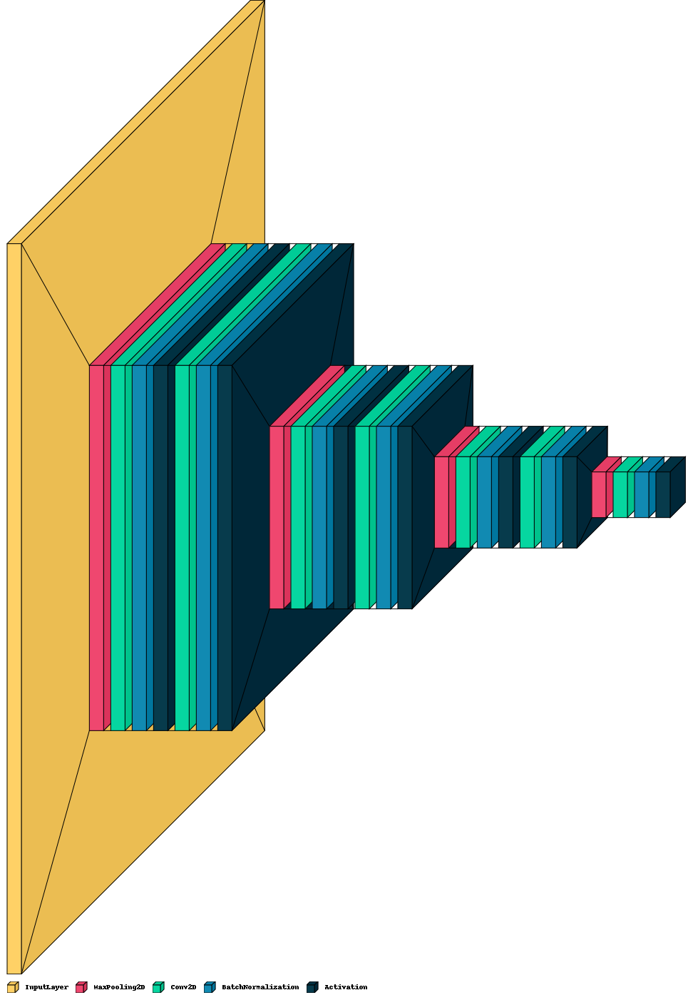

In [ ]:
visualkeras.layered_view(encoder, legend=True)

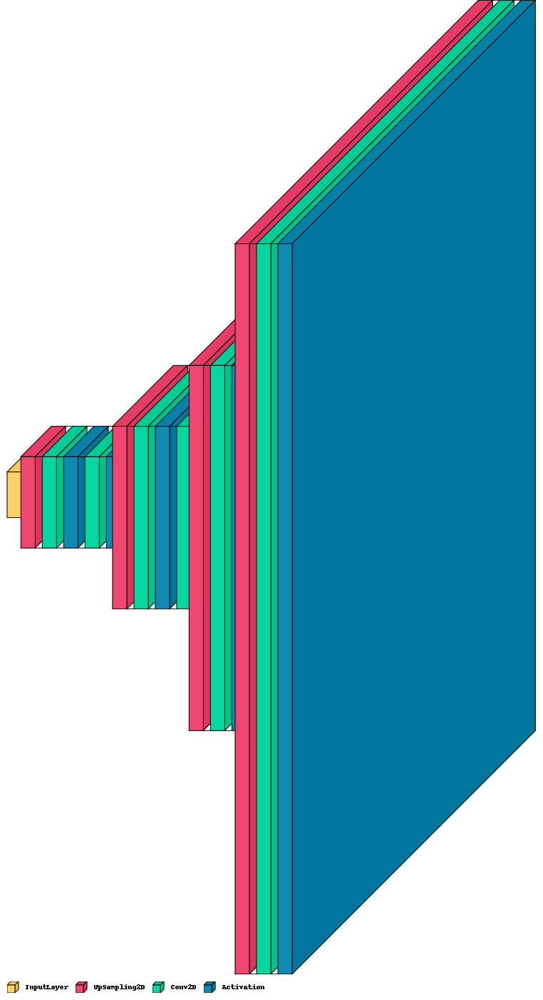

In [ ]:
visualkeras.layered_view(decoder, legend=True)

In [ ]:
history_autoencoder = autoencoder.fit(X_train,
                                        y_train,
                                        validation_data=(X_val, y_val),
                                        epochs=200,
                                        batch_size=32,
                                        callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, mode='min')],).history

Epoch 1/200
122/122 [==============================] - 15s 77ms/step - loss: 0.0686 - accuracy: 0.5593 - val_loss: 0.0667 - val_accuracy: 0.5522
Epoch 2/200
122/122 [==============================] - 9s 70ms/step - loss: 0.0657 - accuracy: 0.5583 - val_loss: 0.0665 - val_accuracy: 0.5522
Epoch 3/200
122/122 [==============================] - 9s 72ms/step - loss: 0.0639 - accuracy: 0.5620 - val_loss: 0.0658 - val_accuracy: 0.5520
Epoch 4/200
122/122 [==============================] - 9s 72ms/step - loss: 0.0621 - accuracy: 0.5758 - val_loss: 0.0633 - val_accuracy: 0.5646
Epoch 5/200
122/122 [==============================] - 9s 73ms/step - loss: 0.0614 - accuracy: 0.5791 - val_loss: 0.0625 - val_accuracy: 0.5676
Epoch 6/200
122/122 [==============================] - 9s 73ms/step - loss: 0.0608 - accuracy: 0.5897 - val_loss: 0.0634 - val_accuracy: 0.5842
Epoch 7/200
122/122 [==============================] - 9s 72ms/step - loss: 0.0605 - accuracy: 0.5922 - val_loss: 0.0611 - val_accuracy

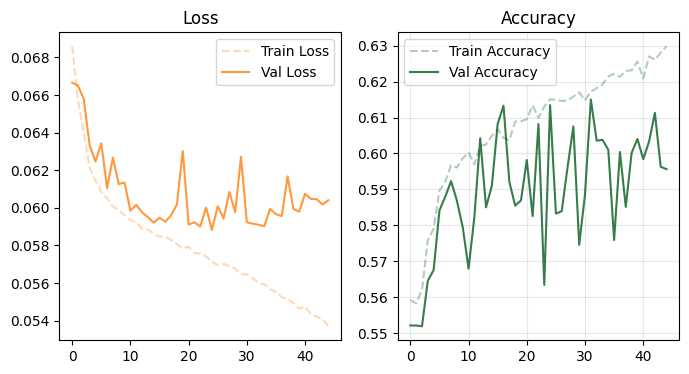

In [ ]:
ut.plot_history(history_autoencoder)

In [ ]:
predictions = autoencoder.predict(X_test)
print(predictions.shape)

16/16 [==============================] - 0s 17ms/step
(485, 256, 256, 2)


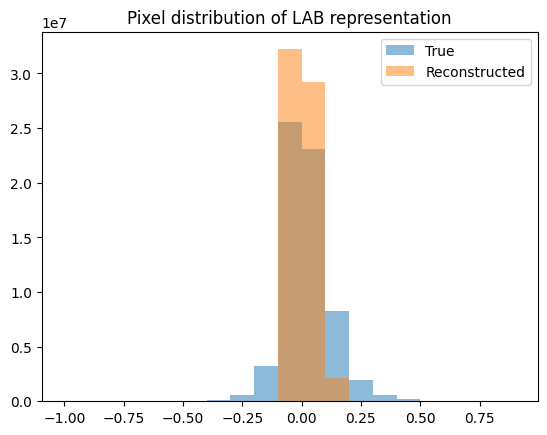

In [ ]:
bins = np.arange(start=-1, stop=1, step=.1)
plt.hist(y_test.flatten(), bins=bins, alpha=0.5, label='True')
plt.hist(predictions.flatten(), bins=bins, alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of LAB representation')
plt.show()

In [ ]:
final = np.zeros((X_test.shape[0], 256, 256, 3))
final[:,:,:,0] = X_test[:,:,:,0]*100
final[:,:,:,1:] = predictions[:,:,:,0:]*128
final = [lab2rgb(img) for img in final]

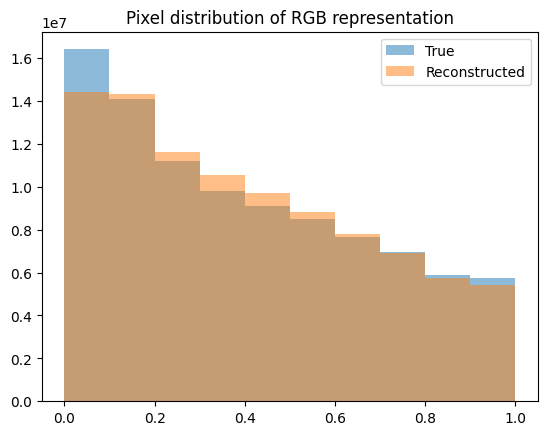

In [ ]:
plt.hist(np.array(test_pics).flatten(), alpha=0.5, label='True')
plt.hist(np.array(final).flatten(), alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of RGB representation')
plt.show()

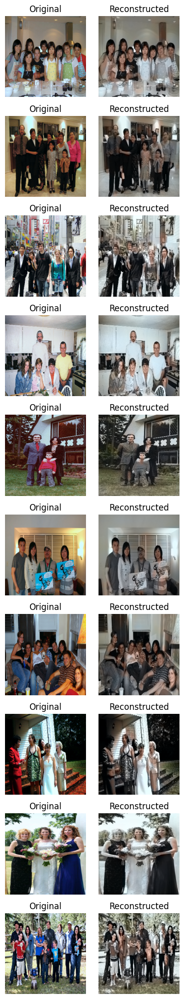

In [ ]:
to_plot = []
for i in range(10):
    to_plot.append(test_pics[i])
    to_plot.append(final[i])

fig, axes = plt.subplots(10, 2, figsize=(4,20))
for i in range(20):
    ax = axes[i%20//2, i%2]
    ax.imshow(np.clip(to_plot[i],0,255))
    if i%2==0: ax.set_title('Original')
    else: ax.set_title('Reconstructed')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
for i in range(0, len(to_plot), 2):
    ut.plot_lab_spectrums(to_plot[i], to_plot[i+1])

Output hidden; open in https://colab.research.google.com to view.

Looking at the AB channels of the reconstructed images, we can see that the reconstructions managed to retrace the different elements of the original images. However, the reconstructions look very blurry and also by looking at the histograms of the pixel distributions, we notice that the predicted values have a limited range compared to the real ones.

In [ ]:
autoencoder.save('autoencoder_mae')

## Autoencoder - PSNR
Use a different loss function, to see if the performances of the autoencoder may improve.

In [ ]:
encoder = build_encoder(enc_input_shape=(256,256,1), enc_output_shape=(16,16,128))
decoder = build_decoder(dec_input_shape=(16,16,128), dec_output_shape=(256,256,2))
autoencoder_psnr = get_autoencoder(encoder, decoder, input_shape=input_shape)
autoencoder_psnr.compile(optimizer= tfk.optimizers.AdamW(), loss=PSNRLoss, metrics=["accuracy"])
autoencoder_psnr.summary()

Model: "Autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 Encoder (Functional)        (None, 16, 16, 128)       102232    
                                                                 
 Decoder (Functional)        (None, 256, 256, 2)       248090    
                                                                 
Total params: 350322 (1.34 MB)
Trainable params: 349778 (1.33 MB)
Non-trainable params: 544 (2.12 KB)
_________________________________________________________________


In [ ]:
history_autoencoder_psnr = autoencoder_psnr.fit(X_train,
                                        y_train,
                                        validation_data=(X_val, y_val),
                                        epochs=200,
                                        batch_size=32,
                                        callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, mode='min')],).history

Epoch 1/200
122/122 [==============================] - 15s 75ms/step - loss: -26.3495 - accuracy: 0.5668 - val_loss: -26.0720 - val_accuracy: 0.5522
Epoch 2/200
122/122 [==============================] - 8s 68ms/step - loss: -26.5978 - accuracy: 0.5870 - val_loss: -26.2344 - val_accuracy: 0.5762
Epoch 3/200
122/122 [==============================] - 8s 69ms/step - loss: -26.6968 - accuracy: 0.5979 - val_loss: -26.1870 - val_accuracy: 0.5791
Epoch 4/200
122/122 [==============================] - 8s 69ms/step - loss: -26.7429 - accuracy: 0.6013 - val_loss: -26.4906 - val_accuracy: 0.5914
Epoch 5/200
122/122 [==============================] - 8s 69ms/step - loss: -26.7786 - accuracy: 0.6036 - val_loss: -26.6103 - val_accuracy: 0.5957
Epoch 6/200
122/122 [==============================] - 8s 68ms/step - loss: -26.8229 - accuracy: 0.6054 - val_loss: -26.2037 - val_accuracy: 0.5583
Epoch 7/200
122/122 [==============================] - 8s 68ms/step - loss: -26.8659 - accuracy: 0.6100 - val_l

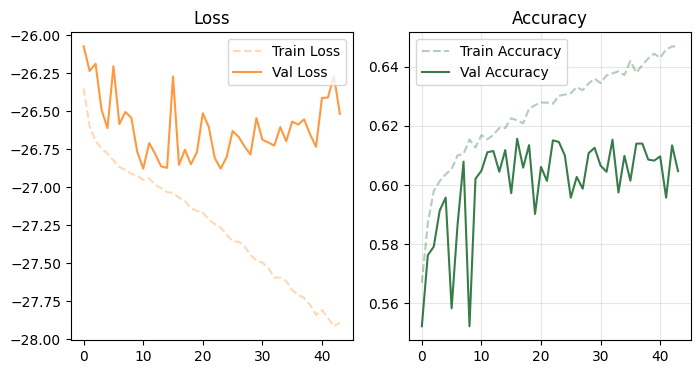

In [ ]:
ut.plot_history(history_autoencoder_psnr)

In [ ]:
predictions_psnr = autoencoder_psnr.predict(X_test)
print(predictions_psnr.shape)

16/16 [==============================] - 0s 17ms/step
(485, 256, 256, 2)


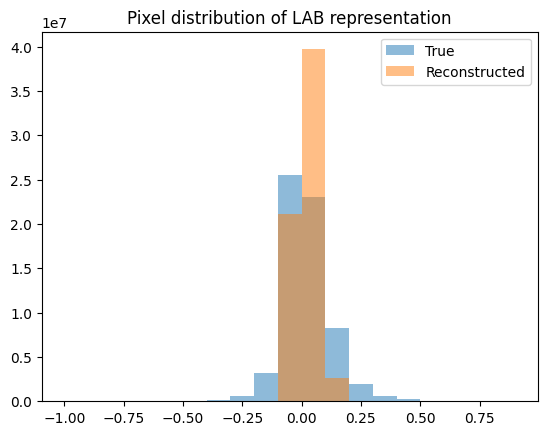

In [ ]:
bins = np.arange(start=-1, stop=1, step=.1)
plt.hist(y_test.flatten(), bins=bins, alpha=0.5, label='True')
plt.hist(predictions_psnr.flatten(), bins=bins, alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of LAB representation')
plt.show()

In [ ]:
final_psnr = np.zeros((X_test.shape[0], 256, 256, 3))
final_psnr[:,:,:,0] = X_test[:,:,:,0]*100
final_psnr[:,:,:,1:] = predictions_psnr[:,:,:,0:]*128
final_psnr = [lab2rgb(img) for img in final_psnr]

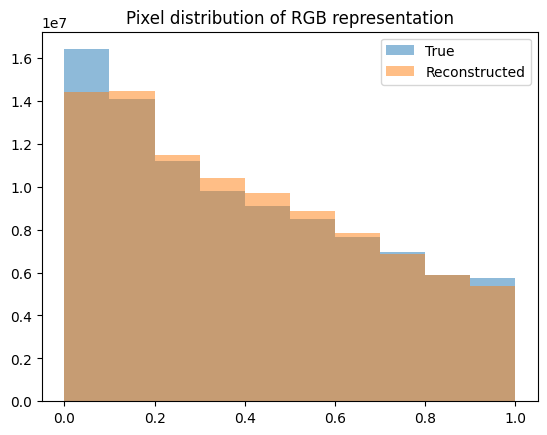

In [ ]:
plt.hist(np.array(test_pics).flatten(), alpha=0.5, label='True')
plt.hist(np.array(final_psnr).flatten(), alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of RGB representation')
plt.show()

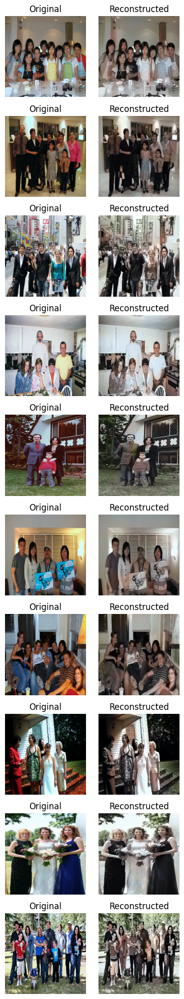

In [ ]:
to_plot = []
for i in range(10):
    to_plot.append(test_pics[i])
    to_plot.append(final_psnr[i])

fig, axes = plt.subplots(10, 2, figsize=(4,20))
for i in range(20):
    ax = axes[i%20//2, i%2]
    ax.imshow(np.clip(to_plot[i],0,255))
    if i%2==0: ax.set_title('Original')
    else: ax.set_title('Reconstructed')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
for i in range(0, len(to_plot), 2):
    ut.plot_lab_spectrums(to_plot[i], to_plot[i+1])

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
autoencoder_psnr.save('autoencoder_psnr')

Changing the loss function to the PSNR did not improve the final performance of the autoencoder. The training metrics are almost the same and also the reconstructed images are mostly the same as the ones under the MAE loss function.

## Autoencoder - SSIM

In [ ]:
encoder = build_encoder(enc_input_shape=(256,256,1), enc_output_shape=(16,16,128))
decoder = build_decoder(dec_input_shape=(16,16,128), dec_output_shape=(256,256,2))
autoencoder_ssim = get_autoencoder(encoder, decoder, input_shape=input_shape)
autoencoder_ssim.compile(optimizer= tfk.optimizers.AdamW(), loss=SSIMLoss, metrics=["accuracy"])
autoencoder_ssim.summary()

Model: "Autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 Encoder (Functional)        (None, 16, 16, 128)       102232    
                                                                 
 Decoder (Functional)        (None, 256, 256, 2)       248090    
                                                                 
Total params: 350322 (1.34 MB)
Trainable params: 349778 (1.33 MB)
Non-trainable params: 544 (2.12 KB)
_________________________________________________________________


In [ ]:
history_autoencoder_ssim = autoencoder_ssim.fit(X_train,
                                        y_train,
                                        validation_data=(X_val, y_val),
                                        epochs=200,
                                        batch_size=32,
                                        callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, mode='min')],).history

Epoch 1/200
122/122 [==============================] - 19s 105ms/step - loss: 0.6585 - accuracy: 0.5610 - val_loss: 0.7057 - val_accuracy: 0.5508
Epoch 2/200
122/122 [==============================] - 12s 98ms/step - loss: 0.6237 - accuracy: 0.5661 - val_loss: 0.7106 - val_accuracy: 0.5507
Epoch 3/200
122/122 [==============================] - 12s 98ms/step - loss: 0.6105 - accuracy: 0.5750 - val_loss: 0.7558 - val_accuracy: 0.5520
Epoch 4/200
122/122 [==============================] - 12s 99ms/step - loss: 0.5979 - accuracy: 0.5814 - val_loss: 0.6973 - val_accuracy: 0.5538
Epoch 5/200
122/122 [==============================] - 12s 98ms/step - loss: 0.5922 - accuracy: 0.5832 - val_loss: 0.5954 - val_accuracy: 0.5781
Epoch 6/200
122/122 [==============================] - 12s 98ms/step - loss: 0.5863 - accuracy: 0.5855 - val_loss: 0.6365 - val_accuracy: 0.5606
Epoch 7/200
122/122 [==============================] - 12s 98ms/step - loss: 0.5840 - accuracy: 0.5861 - val_loss: 0.6135 - val_a

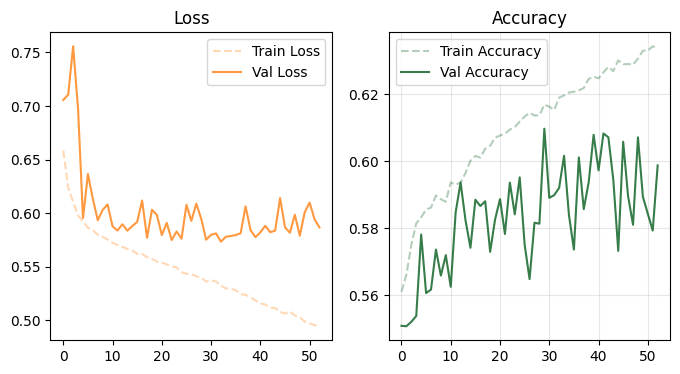

In [ ]:
ut.plot_history(history_autoencoder_ssim)

In [ ]:
predictions_ssim = autoencoder_ssim.predict(X_test)
print(predictions_ssim.shape)

16/16 [==============================] - 0s 16ms/step
(485, 256, 256, 2)


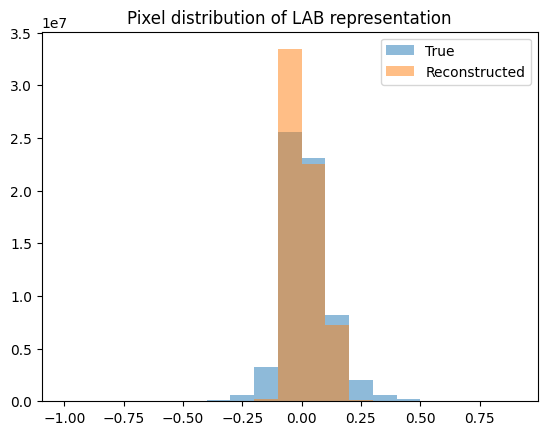

In [ ]:
bins = np.arange(start=-1, stop=1, step=.1)
plt.hist(y_test.flatten(), bins=bins, alpha=0.5, label='True')
plt.hist(predictions_ssim.flatten(), bins=bins, alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of LAB representation')
plt.show()

The distribution of LAB values is more in line with the true ones under the SSIM.

In [ ]:
final_ssim = np.zeros((X_test.shape[0], 256, 256, 3))
final_ssim[:,:,:,0] = X_test[:,:,:,0]*100
final_ssim[:,:,:,1:] = predictions_ssim[:,:,:,0:]*128
final_ssim = [lab2rgb(img) for img in final_ssim]

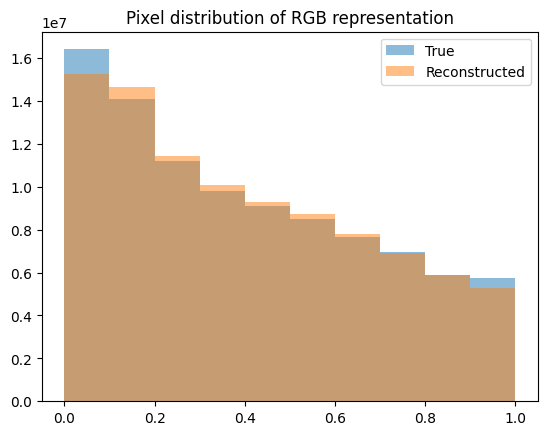

In [ ]:
plt.hist(np.array(test_pics).flatten(), alpha=0.5, label='True')
plt.hist(np.array(final_ssim).flatten(), alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of RGB representation')
plt.show()

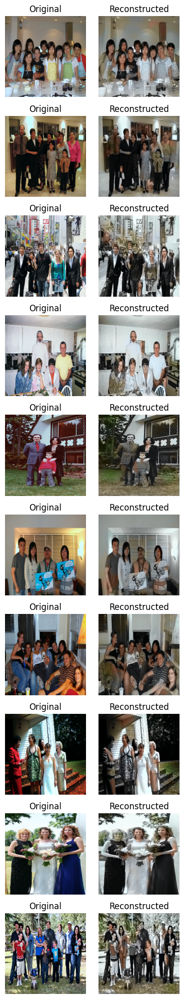

In [ ]:
to_plot = []
for i in range(10):
    to_plot.append(test_pics[i])
    to_plot.append(final_ssim[i])

fig, axes = plt.subplots(10, 2, figsize=(4,20))
for i in range(20):
    ax = axes[i%20//2, i%2]
    ax.imshow(np.clip(to_plot[i],0,255))
    if i%2==0: ax.set_title('Original')
    else: ax.set_title('Reconstructed')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
for i in range(0, len(to_plot), 2):
    ut.plot_lab_spectrums(to_plot[i], to_plot[i+1])

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
autoencoder_ssim.save('autoencoder_ssim')

Improvements but still the performances of the autoencoder are pretty limited, as the final reconstructions look blurry and imprecise.

The arms and hands of the reconstructed images sometimes turn out to be gray because they are a small proportion of the image, and the blurred color reconstructions do not allow for a proper representation of the skin.

## Autoencoder - SSIM + Leaky ReLU
Since the reconstruction is not able to explore the whole range of colors (as extreme values of the AB channels are very limited) we hypothized that it may be due to the activation functions in the decoder which truncate the weights in the filters, letting them be negative only in the last layer (due to the `tanh` activation function).

Using a Leaky ReLU in the last layers of the network may improve the performances of the autoencoder.

In [ ]:
def build_decoder_leaky_relu(dec_input_shape, dec_output_shape, name='Decoder'):

    '''
    Create the decoder with Leaky ReLU activation functions in the last three layers

    Args:
        dec_input_shape (tuple): the dimension of the input tensor.
        dec_output_shape (tuple): the dimension of the output tensor.

    Returns:
        model
    '''

    input_layer = tfkl.Input(shape=(dec_input_shape), name='decoder_input_layer')   # 16, 16, 128

    x = up_conv_bn_block(x=input_layer, filters=128, kernel_size=3, upsample=True, name='1')                               # 32, 32, 128
    x = up_conv_bn_block(x=x, filters=64, kernel_size=3, upsample=False, name='2')                                         # 32, 32, 64
    x = up_conv_bn_block(x=x, filters=32, kernel_size=3, upsample=True, name='3')                                          # 64, 64, 32
    x = up_conv_bn_block(x=x, filters=16, kernel_size=3, upsample=False, activation=tfkl.LeakyReLU(alpha=0.3), name='4')   # 64, 64, 16
    x = up_conv_bn_block(x=x, filters=16, kernel_size=3, upsample=True, activation=tfkl.LeakyReLU(alpha=0.3), name='5')    # 128, 128, 16
    x = up_conv_bn_block(x=x, filters=8, kernel_size=3, upsample=False, activation=tfkl.LeakyReLU(alpha=0.3), name='6')    # 128, 128, 8

    output_layer = up_conv_bn_block(x=x, filters=dec_output_shape[-1], kernel_size=3, padding='same', upsample=True, activation='tanh', name='7')    # 256, 256, 2

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='Decoder')

    return model

In [ ]:
encoder = build_encoder(enc_input_shape=(256,256,1), enc_output_shape=(16,16,128))
decoder = build_decoder_leaky_relu(dec_input_shape=(16,16,128), dec_output_shape=(256,256,2))
autoencoder_ssim_relu = get_autoencoder(encoder, decoder, input_shape=input_shape)
autoencoder_ssim_relu.compile(optimizer=tfk.optimizers.AdamW(), loss=SSIMLoss, metrics=["accuracy"])
autoencoder_ssim_relu.summary()

Model: "Autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 Encoder (Functional)        (None, 16, 16, 128)       102232    
                                                                 
 Decoder (Functional)        (None, 256, 256, 2)       248090    
                                                                 
Total params: 350322 (1.34 MB)
Trainable params: 349778 (1.33 MB)
Non-trainable params: 544 (2.12 KB)
_________________________________________________________________


In [ ]:
history_autoencoder_ssim_relu = autoencoder_ssim_relu.fit(X_train,
                                        y_train,
                                        validation_data=(X_val, y_val),
                                        epochs=200,
                                        batch_size=32,
                                        callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, mode='min')],).history

Epoch 1/200
122/122 [==============================] - 19s 105ms/step - loss: 0.6831 - accuracy: 0.5497 - val_loss: 0.7502 - val_accuracy: 0.5522
Epoch 2/200
122/122 [==============================] - 12s 97ms/step - loss: 0.6241 - accuracy: 0.5693 - val_loss: 0.7480 - val_accuracy: 0.5522
Epoch 3/200
122/122 [==============================] - 12s 98ms/step - loss: 0.6056 - accuracy: 0.5748 - val_loss: 0.6829 - val_accuracy: 0.5664
Epoch 4/200
122/122 [==============================] - 12s 99ms/step - loss: 0.5954 - accuracy: 0.5813 - val_loss: 0.6706 - val_accuracy: 0.5589
Epoch 5/200
122/122 [==============================] - 12s 99ms/step - loss: 0.5900 - accuracy: 0.5860 - val_loss: 0.6034 - val_accuracy: 0.5602
Epoch 6/200
122/122 [==============================] - 12s 98ms/step - loss: 0.5836 - accuracy: 0.5908 - val_loss: 0.6003 - val_accuracy: 0.5832
Epoch 7/200
122/122 [==============================] - 12s 98ms/step - loss: 0.5799 - accuracy: 0.5937 - val_loss: 0.5985 - val_a

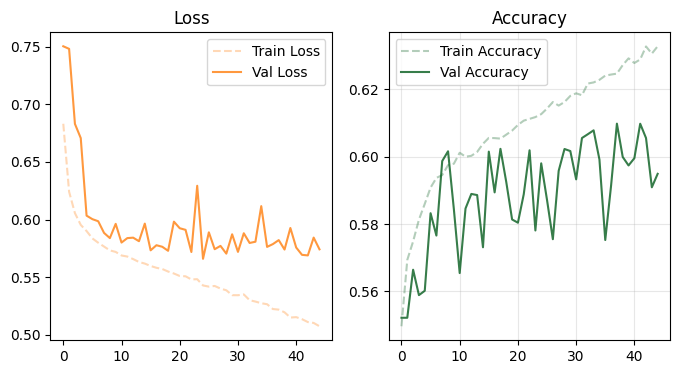

In [ ]:
ut.plot_history(history_autoencoder_ssim_relu)

In [ ]:
predictions_ssim_relu = autoencoder_ssim_relu.predict(X_test)
print(predictions_ssim_relu.shape)

16/16 [==============================] - 0s 18ms/step
(485, 256, 256, 2)


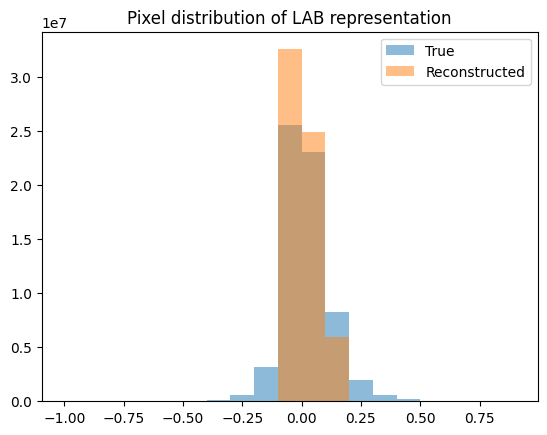

In [ ]:
bins = np.arange(start=-1, stop=1, step=.1)
plt.hist(y_test.flatten(), bins=bins, alpha=0.5, label='True')
plt.hist(predictions_ssim_relu.flatten(), bins=bins, alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of LAB representation')
plt.show()

In [ ]:
final_ssim_relu = np.zeros((X_test.shape[0], 256, 256, 3))
final_ssim_relu[:,:,:,0] = X_test[:,:,:,0]*100
final_ssim_relu[:,:,:,1:] = predictions_ssim_relu[:,:,:,0:]*128
final_ssim_relu = [lab2rgb(img) for img in final_ssim_relu]

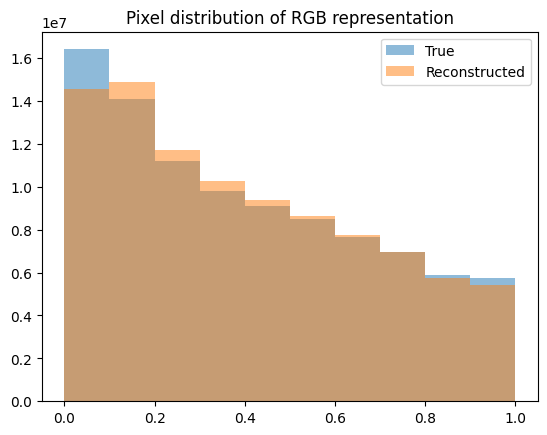

In [ ]:
plt.hist(np.array(test_pics).flatten(), alpha=0.5, label='True')
plt.hist(np.array(final_ssim_relu).flatten(), alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of RGB representation')
plt.show()

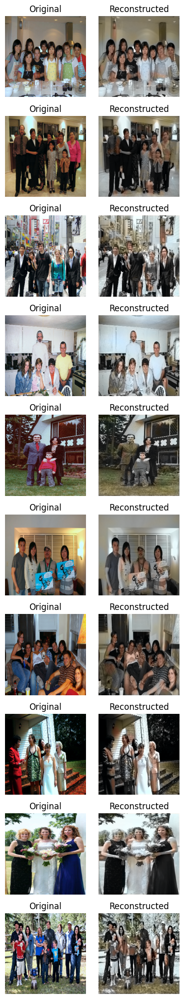

In [ ]:
to_plot = []
for i in range(10):
    to_plot.append(test_pics[i])
    to_plot.append(final_ssim_relu[i])

fig, axes = plt.subplots(10, 2, figsize=(4,20))
for i in range(20):
    ax = axes[i%20//2, i%2]
    ax.imshow(np.clip(to_plot[i],0,255))
    if i%2==0: ax.set_title('Original')
    else: ax.set_title('Reconstructed')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
for i in range(0, len(to_plot), 2):
    ut.plot_lab_spectrums(to_plot[i], to_plot[i+1])

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
autoencoder_ssim_relu.save('autoencoder_ssim_relu')

Even better results but with some red stains.

## Autoencoder - Combined loss + Leaky ReLU

No real theoretical reason to combine all the losses, however this approach may correct the penalizations.

In [ ]:
def build_decoder_leaky_relu(dec_input_shape, dec_output_shape):

    '''
    Create the decoder with Leaky ReLU activation functions in the last three layers.

    Args:
        dec_input_shape (tuple): the dimension of the input tensor.
        dec_output_shape (tuple): the dimension of the output tensor.

    Returns:
        model
    '''

    input_layer = tfkl.Input(shape=(dec_input_shape), name='decoder_input_layer')   # 16, 16, 128

    x = up_conv_bn_block(x=input_layer, filters=128, kernel_size=3, upsample=True, name='1')                                # 32, 32, 128
    x = up_conv_bn_block(x=x, filters=64, kernel_size=3, upsample=False, name='2')                                          # 32, 32, 64
    x = up_conv_bn_block(x=x, filters=32, kernel_size=3, upsample=True, name='3')                                           # 64, 64, 32
    x = up_conv_bn_block(x=x, filters=16, kernel_size=3, upsample=False, activation=tfkl.LeakyReLU(alpha=0.3), name='4')    # 64, 64, 16
    x = up_conv_bn_block(x=x, filters=16, kernel_size=3, upsample=True, activation=tfkl.LeakyReLU(alpha=0.3), name='5')     # 128, 128, 16
    x = up_conv_bn_block(x=x, filters=8, kernel_size=3, upsample=False, activation=tfkl.LeakyReLU(alpha=0.3), name='6')     # 128, 128, 8

    output_layer = up_conv_bn_block(x=x, filters=dec_output_shape[-1], kernel_size=3, padding='same', upsample=True, activation='tanh', name='7')    # 256, 256, 2

    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='Decoder')

    return model

In [ ]:
encoder = build_encoder(enc_input_shape=(256,256,1), enc_output_shape=(16,16,128))
decoder = build_decoder_leaky_relu(dec_input_shape=(16,16,128), dec_output_shape=(256,256,2))

autoencoder_comb_relu = get_autoencoder(encoder, decoder, input_shape=input_shape)
autoencoder_comb_relu.compile(optimizer= tfk.optimizers.AdamW(), loss=['mae', PSNRLoss, SSIMLoss], metrics=["accuracy"])    # Compile the model with all loss functions
autoencoder_comb_relu.summary()

Model: "Autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 256, 1)]     0         
                                                                 
 Encoder (Functional)        (None, 16, 16, 128)       102232    
                                                                 
 Decoder (Functional)        (None, 256, 256, 2)       248090    
                                                                 
Total params: 350322 (1.34 MB)
Trainable params: 349778 (1.33 MB)
Non-trainable params: 544 (2.12 KB)
_________________________________________________________________


In [ ]:
history_autoencoder_comb_relu = autoencoder_comb_relu.fit(X_train,
                                        y_train,
                                        validation_data=(X_val, y_val),
                                        epochs=200,
                                        batch_size=32,
                                        callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True, mode='min')],).history

Epoch 1/200
122/122 [==============================] - 15s 77ms/step - loss: 0.0664 - accuracy: 0.5521 - val_loss: 0.0671 - val_accuracy: 0.5509
Epoch 2/200
122/122 [==============================] - 9s 70ms/step - loss: 0.0622 - accuracy: 0.5667 - val_loss: 0.0669 - val_accuracy: 0.5521
Epoch 3/200
122/122 [==============================] - 9s 70ms/step - loss: 0.0612 - accuracy: 0.5743 - val_loss: 0.0656 - val_accuracy: 0.5523
Epoch 4/200
122/122 [==============================] - 9s 71ms/step - loss: 0.0606 - accuracy: 0.5838 - val_loss: 0.0638 - val_accuracy: 0.5632
Epoch 5/200
122/122 [==============================] - 9s 71ms/step - loss: 0.0603 - accuracy: 0.5869 - val_loss: 0.0637 - val_accuracy: 0.5582
Epoch 6/200
122/122 [==============================] - 9s 72ms/step - loss: 0.0600 - accuracy: 0.5923 - val_loss: 0.0605 - val_accuracy: 0.5785
Epoch 7/200
122/122 [==============================] - 9s 72ms/step - loss: 0.0596 - accuracy: 0.5964 - val_loss: 0.0605 - val_accuracy

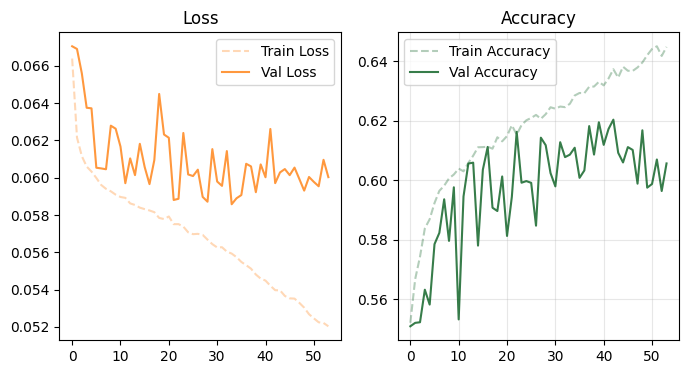

In [ ]:
ut.plot_history(history_autoencoder_comb_relu)

In [ ]:
predictions_comb_relu = autoencoder_comb_relu.predict(X_test)
print(predictions_comb_relu.shape)

16/16 [==============================] - 0s 19ms/step
(485, 256, 256, 2)


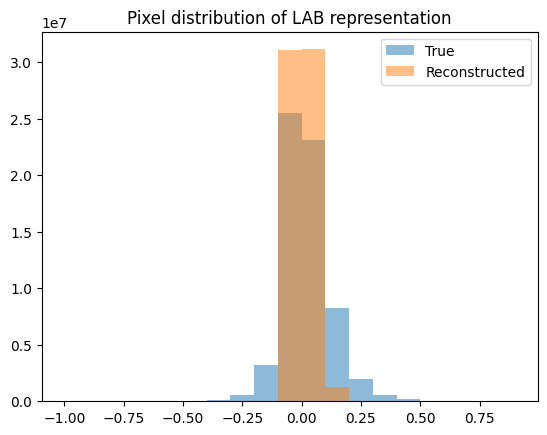

In [ ]:
bins = np.arange(start=-1, stop=1, step=.1)
plt.hist(y_test.flatten(), bins=bins, alpha=0.5, label='True')
plt.hist(predictions_comb_relu.flatten(), bins=bins, alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of LAB representation')
plt.show()

In [ ]:
final_comb_relu = np.zeros((X_test.shape[0], 256, 256, 3))
final_comb_relu[:,:,:,0] = X_test[:,:,:,0]*100
final_comb_relu[:,:,:,1:] = predictions_comb_relu[:,:,:,0:]*128
final_comb_relu = [lab2rgb(img) for img in final_comb_relu]

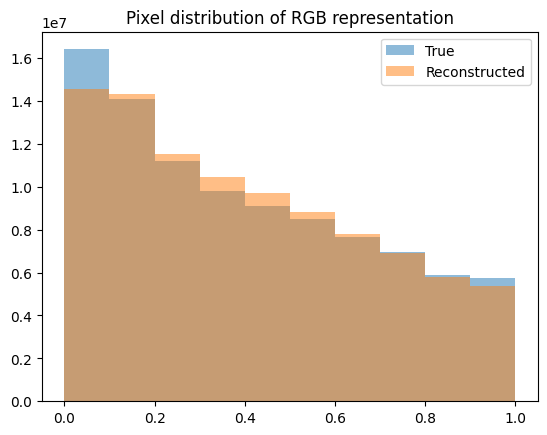

In [ ]:
plt.hist(np.array(test_pics).flatten(), alpha=0.5, label='True')
plt.hist(np.array(final_comb_relu).flatten(), alpha=0.5, label='Reconstructed')
plt.legend()
plt.title('Pixel distribution of RGB representation')
plt.show()

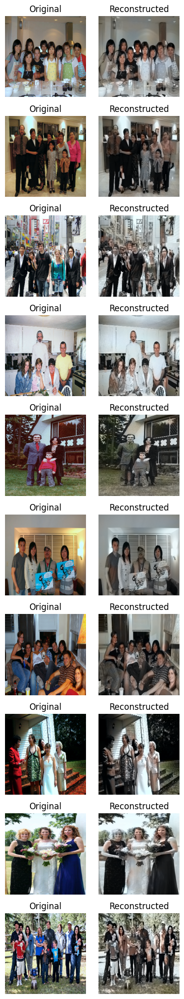

In [ ]:
to_plot = []
for i in range(10):
    to_plot.append(test_pics[i])
    to_plot.append(final_comb_relu[i])

fig, axes = plt.subplots(10, 2, figsize=(4,20))
for i in range(20):
    ax = axes[i%20//2, i%2]
    ax.imshow(np.clip(to_plot[i],0,255))
    if i%2==0: ax.set_title('Original')
    else: ax.set_title('Reconstructed')
    ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
for i in range(0, len(to_plot), 2):
    ut.plot_lab_spectrums(to_plot[i], to_plot[i+1])

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
autoencoder_comb_relu.save('autoencoder_comb_relu')

Imprecise and blurred reconstructions, as expected.

## Load models

In [29]:
autoencoder_mae = tfk.models.load_model('autoencoder_mae')

In [17]:
autoencoder_psnr = tfk.models.load_model('autoencoder_psnr', compile=False)
autoencoder_psnr.compile(optimizer=tfk.optimizers.AdamW(), loss=PSNRLoss, metrics=["accuracy"])

In [18]:
autoencoder_ssim = tfk.models.load_model('autoencoder_ssim', compile=False)
autoencoder_ssim.compile(optimizer=tfk.optimizers.AdamW(), loss=SSIMLoss, metrics=["accuracy"])

In [19]:
autoencoder_ssim_relu = tfk.models.load_model('autoencoder_ssim_relu', compile=False)
autoencoder_ssim_relu.compile(optimizer=tfk.optimizers.AdamW(), loss=SSIMLoss, metrics=["accuracy"])

## Test the models on a true historical image

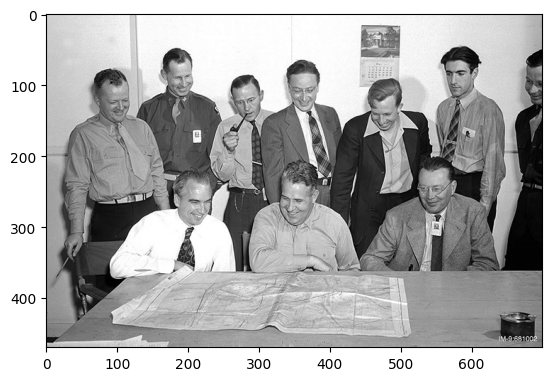

In [10]:
pic = np.array(Image.open('bradbury.jpg'))
plt.imshow(pic)

In [11]:
pic = cv2.resize(pic, (256, 256))
pic_lab = rgb2lab(pic)

X_pic = pic_lab[:,:,0] / 100

X_pic = X_pic.reshape(X_pic.shape+(1,))
print(X_pic.shape)

(256, 256, 1)


In [20]:
# Colorize the image using the autoencoder trained using the PSNR
pred_psnr = autoencoder_psnr.predict(np.array([X_pic]))
print(pred_psnr.shape, pred_psnr[0].shape)

psnr_col = np.zeros((256, 256, 3))
psnr_col[:,:,0] = X_pic[:,:,0] * 100
psnr_col[:,:,1:] = pred_psnr * 128
psnr_col = lab2rgb(psnr_col)


# Colorize the image using the autoencoder trained using the SSIM
pred_ssim = autoencoder_ssim.predict(np.array([X_pic]))
print(pred_ssim.shape, pred_ssim[0].shape)

ssim_col = np.zeros((256, 256, 3))
ssim_col[:,:,0] = X_pic[:,:,0] * 100
ssim_col[:,:,1:] = pred_ssim * 128
ssim_col = lab2rgb(ssim_col)


# Colorize the image using the autoencoder trained using the SSIM with ReLU
pred_ssim_relu = autoencoder_ssim_relu.predict(np.array([X_pic]))
print(pred_ssim_relu.shape, pred_ssim_relu[0].shape)

ssim_relu_col = np.zeros((256, 256, 3))
ssim_relu_col[:,:,0] = X_pic[:,:,0] * 100
ssim_relu_col[:,:,1:] = pred_ssim_relu * 128
ssim_relu_col = lab2rgb(ssim_relu_col)

1/1 [==============================] - 2s 2s/step
(1, 256, 256, 2) (256, 256, 2)
1/1 [==============================] - 0s 203ms/step
(1, 256, 256, 2) (256, 256, 2)
1/1 [==============================] - 0s 270ms/step
(1, 256, 256, 2) (256, 256, 2)


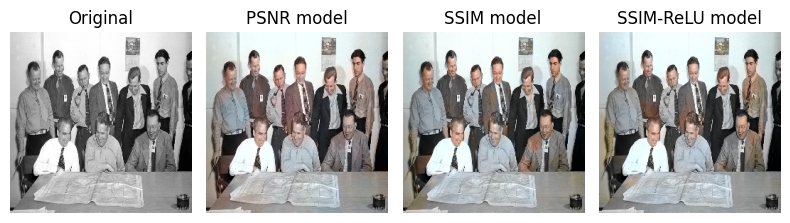

In [47]:
fig, axes = plt.subplots(1, 4, figsize=(8,4))
axes[0].imshow(pic)
axes[0].set_title('Original')
axes[0].axis('off')
axes[1].imshow(psnr_col)
axes[1].set_title('PSNR model')
axes[1].axis('off')
axes[2].imshow(ssim_col)
axes[2].set_title('SSIM model')
axes[2].axis('off')
axes[3].imshow(ssim_relu_col)
axes[3].set_title('SSIM-ReLU model')
axes[3].axis('off')
plt.tight_layout()
plt.show()

Looking at the full reconstruction, the PSNR model is the best one.

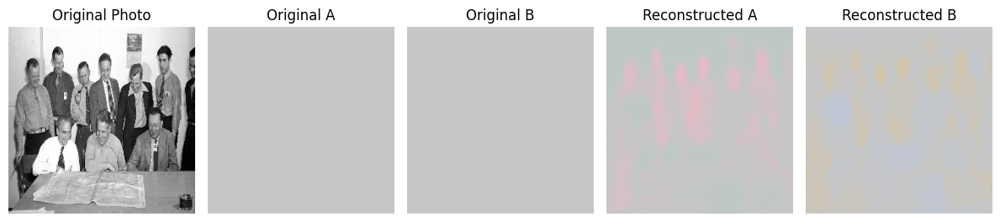

In [22]:
ut.plot_lab_spectrums(pic, psnr_col)

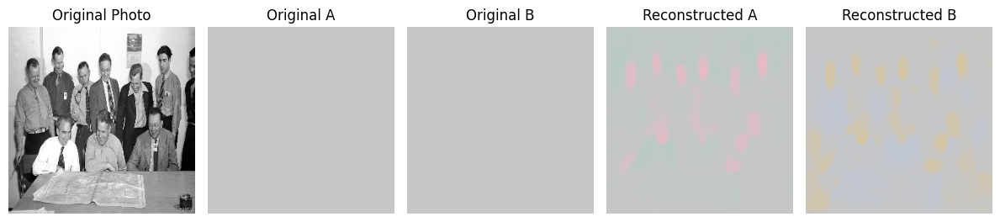

In [23]:
ut.plot_lab_spectrums(pic, ssim_col)

Less blurred reconstruction, however some red stains in undesired areas of the image.

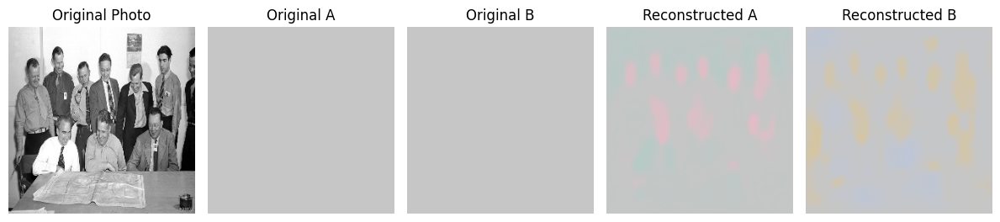

In [24]:
ut.plot_lab_spectrums(pic, ssim_relu_col)

## Metrics comparison

In [38]:
lab_test_pred_1 = autoencoder_mae.predict(X_test)
lab_test_pred_2 = autoencoder_psnr.predict(X_test)
lab_test_pred_3 = autoencoder_ssim.predict(X_test)
lab_test_pred_4 = autoencoder_ssim_relu.predict(X_test)

16/16 [==============================] - 0s 8ms/step


In [43]:
tensor1 = tf.constant(y_test, dtype=tf.float32)
tensor2 = tf.constant(lab_test_pred_1, dtype=tf.float32)
abs_diff = tf.abs(tensor1-tensor2)
mae_test = tf.reduce_mean(abs_diff)
SSIM_test = tf.reduce_mean(tf.image.ssim(y_test, lab_test_pred_1, max_val = 2.0))
PSNR_test = tf.reduce_mean(tf.image.psnr(y_test, lab_test_pred_1, max_val = 2.0))
print(f'The MAE reached on the test set with the Autoencoder trained on MAE is: {mae_test}')
print(f'The SSIM reached on the test set with the Autoencoder trained on MAE is: {SSIM_test}')
print(f'The PSNR reached on the test set with the Autoencoder trained on MAE is: {PSNR_test}')

The MAE reached on the test set with this cGAN is: 0.05844709277153015
The SSIM reached on the test set with this cGAN is: 0.42281144857406616
The PSNR reached on the test set with this cGAN is: 27.908689498901367


In [44]:
tensor1 = tf.constant(y_test, dtype=tf.float32)
tensor2 = tf.constant(lab_test_pred_2, dtype=tf.float32)
abs_diff = tf.abs(tensor1-tensor2)
mae_test = tf.reduce_mean(abs_diff)
SSIM_test = tf.reduce_mean(tf.image.ssim(y_test, lab_test_pred_2, max_val = 2.0))
PSNR_test = tf.reduce_mean(tf.image.psnr(y_test, lab_test_pred_2, max_val = 2.0))
print(f'The MAE reached on the test set with the Autoencoder trained on PSNR is: {mae_test}')
print(f'The SSIM reached on the test set with the Autoencoder trained on PSNR is: {SSIM_test}')
print(f'The PSNR reached on the test set with the Autoencoder trained on PSNR is: {PSNR_test}')

The MAE reached on the test set with this cGAN is: 0.059664081782102585
The SSIM reached on the test set with this cGAN is: 0.39536216855049133
The PSNR reached on the test set with this cGAN is: 27.873920440673828


In [45]:
tensor1 = tf.constant(y_test, dtype=tf.float32)
tensor2 = tf.constant(lab_test_pred_3, dtype=tf.float32)
abs_diff = tf.abs(tensor1-tensor2)
mae_test = tf.reduce_mean(abs_diff)
SSIM_test = tf.reduce_mean(tf.image.ssim(y_test, lab_test_pred_3, max_val = 2.0))
PSNR_test = tf.reduce_mean(tf.image.psnr(y_test, lab_test_pred_3, max_val = 2.0))
print(f'The MAE reached on the test set with the Autoencoder trained on SSIM is: {mae_test}')
print(f'The SSIM reached on the test set with the Autoencoder trained on SSIM is: {SSIM_test}')
print(f'The PSNR reached on the test set with the Autoencoder trained on SSIM is: {PSNR_test}')

The MAE reached on the test set with this cGAN is: 0.060061387717723846
The SSIM reached on the test set with this cGAN is: 0.42739641666412354
The PSNR reached on the test set with this cGAN is: 27.571582794189453


In [46]:
tensor1 = tf.constant(y_test, dtype=tf.float32)
tensor2 = tf.constant(lab_test_pred_4, dtype=tf.float32)
abs_diff = tf.abs(tensor1-tensor2)
mae_test = tf.reduce_mean(abs_diff)
SSIM_test = tf.reduce_mean(tf.image.ssim(y_test, lab_test_pred_4, max_val = 2.0))
PSNR_test = tf.reduce_mean(tf.image.psnr(y_test, lab_test_pred_4, max_val = 2.0))
print(f'The MAE reached on the test set with the Autoencoder trained on SSIM with Leaky ReLU is: {mae_test}')
print(f'The SSIM reached on the test set with the Autoencoder trained on SSIM with Leaky ReLU is: {SSIM_test}')
print(f'The PSNR reached on the test set with the Autoencoder trained on SSIM with Leaky ReLU is: {PSNR_test}')

The MAE reached on the test set with this cGAN is: 0.05924369394779205
The SSIM reached on the test set with this cGAN is: 0.43475478887557983
The PSNR reached on the test set with this cGAN is: 27.684080123901367
